# Computer Vision 2023 Assignment 2: Image matching and retrieval

In this prac, you will experiment with image feature detectors, descriptors and matching. There are 3 main parts to the prac:

- matching an object in a pair of images
- searching for an object in a collection of images
- analysis and discussion of results

## General instructions

As before, you will use this notebook to run your code and display your results and analysis. Again we will mark a PDF conversion of your notebook, referring to your code if necessary, so you should ensure your code output is formatted neatly.

***When converting to PDF, include the outputs and analysis only, not your code.*** You can do this from the command line using the `nbconvert` command (installed as part of Jupyter) as follows:

    jupyter nbconvert Assignment2.ipynb --to pdf --no-input --TagRemovePreprocessor.remove_cell_tags 'remove-cell'

This will also remove the preamble text from each question. It has been packaged into a small notebook you can run in colab, called notebooktopdf.ipynb


We will use the `OpenCV` library to complete the prac. It has several built in functions that will be useful. You are expected to consult documentation and use them appropriately.

As with the last assignment it is somewhat up to you how you answer each question. Ensure that the outputs and report are clear and easy to read so that the markers can rapidly assess what you have done, why, and how deep is your understanding. This includes:

- sizing, arranging and captioning image outputs appropriately
- explaining what you have done clearly and concisely
- clearly separating answers to each question

## Data

We have provided some example images for this assignment, available through a link on the MyUni assignment page. The images are organised by subject matter, with one folder containing images of book covers, one of museum exhibits, and another of urban landmarks. You should copy these data into a directory A2_smvs, keeping the directory structure the same as in the zip file.  

Within each category (within each folder), there is a “Reference” folder containing a clean image of each object and a “Query” folder containing images taken on a mobile device. Within each category, images with the same name contain the same object (so 001.jpg in the Reference folder contains the same book as 001.jpg in the Query folder).
The data is a subset of the Stanford Mobile Visual Search Dataset which is available at

<http://web.cs.wpi.edu/~claypool/mmsys-dataset/2011/stanford/index.html>.

The full data set contains more image categories and more query images of the objects we have provided, which may be useful for your testing!

Do not submit your own copy of the data or rename any files or folders! For marking, we will assume the datasets are available in subfolders of the working directory using the same folder names provided.

Here is some general setup code, which you can edit to suit your needs.

In [30]:
# from google.colab import drive
# drive.mount('/content/drive')

In [31]:
#!pwd
#%cd drive/MyDrive/Colab\ Notebooks
#!pwd

In [ ]:
# Numpy is the main package for scientific computing with Python.
import numpy as np
import cv2

# Matplotlib is a useful plotting library for python
import matplotlib.pyplot as plt
# This code is to make matplotlib figures appear inline in the
# notebook rather than in a new window.
%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots, can be changed
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# Some more magic so that the notebook will reload external python modules;
# see http://stackoverflow.com/questions/1907993/autoreload-of-modules-in-ipython
%load_ext autoreload
%autoreload 2
%reload_ext autoreload

In [77]:
def draw_outline(ref, query, model):
    """
        Draw outline of reference image in the query image.
        This is just an example to show the steps involved.
        You can modify to suit your needs.
        Inputs:
            ref: reference image
            query: query image
            model: estimated transformation from query to reference image
    """
    h,w = ref.shape[:2]
    pts = np.float32([ [0,0],[0,h-1],[w-1,h-1],[w-1,0] ]).reshape(-1,1,2)
    dst = cv2.perspectiveTransform(pts,model)

    img = query.copy()
    img_color = cv2.cvtColor(img, cv2.COLOR_GRAY2BGR)  # convert to BGR for colored lines
    img_color = cv2.polylines(img_color, [np.int32(dst)], True, (0, 0, 255), 3, cv2.LINE_AA)  # red
    plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB))
    plt.title("Projected Outline")
    plt.show()


def draw_inliers(img1, img2, kp1, kp2, matches, matchesMask):
    """
        Draw inlier between images
        img1 / img2: reference/query  img
        kp1 / kp2: their keypoints
        matches : list of (good) matches after ratio test
        matchesMask: Inlier mask returned in cv2.findHomography()
    """
    matchesMask = matchesMask.ravel().tolist()
    draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                    singlePointColor = None,
                    matchesMask = matchesMask, # draw only inliers
                    flags = 2)
    img3 = cv2.drawMatches(img1,kp1,img2,kp2,matches,None,**draw_params)
    plt.imshow(img3, 'gray'),plt.show()


def drawlines(img1, img2, lines, pts1, pts2):
    """
    img1 - image on which we draw the epilines
    img2 - image where the points are defined
    lines - epilines corresponding to pts2 (computed by cv2.computeCorrespondEpilines)
    pts1 - points in image 1
    pts2 - corresponding points in image 2
    """
    r, c = img1.shape
    img1_color = cv2.cvtColor(img1, cv2.COLOR_GRAY2BGR)
    img2_color = cv2.cvtColor(img2, cv2.COLOR_GRAY2BGR)

    for line, pt1, pt2 in zip(lines, pts1, pts2):
        a, b, c_line = line[0]

        color = tuple(np.random.randint(0, 255, 3).tolist())
        x0, y0 = 0, int(-c_line / b)
        x1, y1 = img1.shape[1], int(-(c_line + a * img1.shape[1]) / b)

        img1_color = cv2.line(img1_color, (x0, y0), (x1, y1), color, 1)
        img1_color = cv2.circle(img1_color, tuple(pt1), 5, color, -1)
        img2_color = cv2.circle(img2_color, tuple(pt2), 5, color, -1)

    return img1_color, img2_color


def match_and_evaluate(ref_path, query_path, detector='ORB', ratio=0.8, ransac_thresh=2.0, show_images=True):
    """
    runs the full matching pipeline on one image pair.
    """
    print(f"\n=== matching {ref_path} vs {query_path} ===")
    
    # Load images in grayscale
    img1 = cv2.imread(ref_path, 0)
    img2 = cv2.imread(query_path, 0)
    if img1 is None or img2 is None:
        print("error loading one of the images.")
        return

    # Detect + compute descriptors
    if detector == 'ORB':
        feature = cv2.ORB_create(nfeatures=1000)
    elif detector == 'AKAZE':
        feature = cv2.AKAZE_create()
    else:
        print("unsupported detector")
        return

    kp1, des1 = feature.detectAndCompute(img1, None)
    kp2, des2 = feature.detectAndCompute(img2, None)

    # Match using BFMatcher + ratio test
    bf = cv2.BFMatcher(cv2.NORM_HAMMING)
    matches = bf.knnMatch(des1, des2, k=2)

    good = []
    for m, n in matches:
        if m.distance < ratio * n.distance:
            good.append(m)

    print(f"detected keypoints: ref={len(kp1)}, query={len(kp2)}")
    print(f"good matches after ratio test: {len(good)}")

    if len(good) >= 4:
        src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1,1,2)
        dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1,1,2)
        
        M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_thresh)
        if M is None:
            print("homography estimation failed.")
            return
        inliers = int(np.sum(mask))
        print(f"inliers: {inliers} / {len(good)} good matches")

        if show_images:
            draw_outline(img1, img2, M)
            draw_inliers(img1, img2, kp1, kp2, good, mask)
    else:
        print("not enough good matches to estimate homography.")


# Question 1: Matching an object in a pair of images (60%)


In this question, the aim is to accurately locate a reference object in a query image, for example:

![Books](book.png "Books")

0. Download and read through the paper [ORB: an efficient alternative to SIFT or SURF](https://www.researchgate.net/publication/221111151_ORB_an_efficient_alternative_to_SIFT_or_SURF) by Rublee et al. You don't need to understand all the details, but try to get an idea of how it works. ORB combines the FAST corner detector and the BRIEF descriptor. BRIEF is based on similar ideas to the SIFT descriptor we covered week 3, but with some changes for efficiency.

1. [Load images] Load the first (reference, query) image pair from the "book_covers" category using opencv (e.g. `img=cv2.imread()`). Check the parameter option in "
cv2.imread()" to ensure that you read the gray scale image, since it is necessary for computing ORB features.

2. [Detect features] Create opencv ORB feature extractor by `orb=cv2.ORB_create()`. Then you can detect keypoints by `kp = orb.detect(img,None)`, and compute descriptors by `kp, des = orb.compute(img, kp)`. You need to do this for each image, and then you can use `cv2.drawKeypoints()` for visualization.

3. [Match features] As ORB is a binary feature, you need to use HAMMING distance for matching, e.g., `bf = cv2.BFMatcher(cv2.NORM_HAMMING)`. Then you are requried to do KNN matching (k=2) by using `bf.knnMatch()`. After that, you are required to use "ratio_test". Ratio test was used in SIFT to find good matches and was described in the lecture. By default, you can set `ratio=0.8`.

4. [Plot and analyze] You need to visualize the matches by using the `cv2.drawMatches()` function. Also you can change the ratio values, parameters in `cv2.ORB_create()`, and distance functions in `cv2.BFMatcher()`. Please discuss how these changes influence the match numbers.


In [34]:
# load images as grey scale
img1 = cv2.imread('A2_smvs/book_covers/Reference/001.jpg', 0)
if not np.shape(img1):
  # Error message and print current working dir
  print("Could not load img1. Check the path, filename and current working directory\n")
  !pwd
img2 = cv2.imread("A2_smvs/book_covers/Query/001.jpg", 0)
if not np.shape(img2):
  # Error message and print current working dir
  print("Could not load img2. Check the path, filename and current working directory\n")
  !pwd

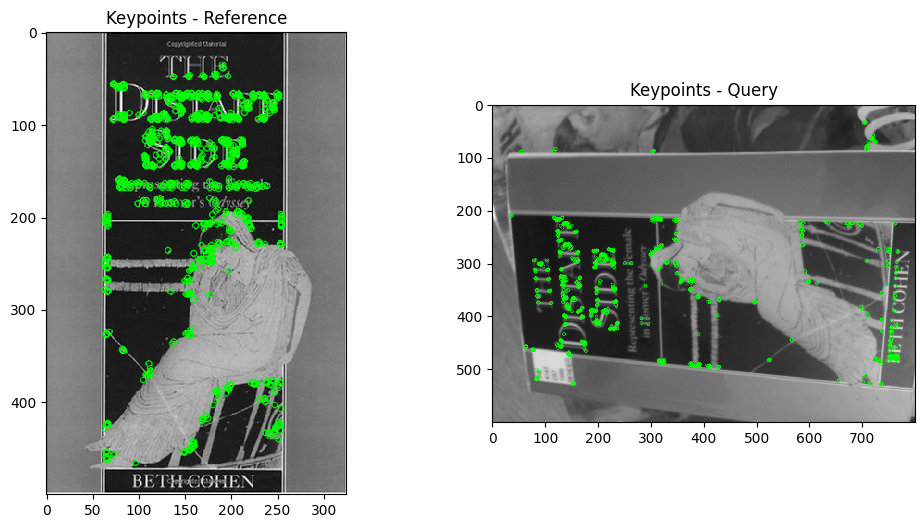

total keypoints in ref: 981, query: 1000
good matches after ratio test: 221


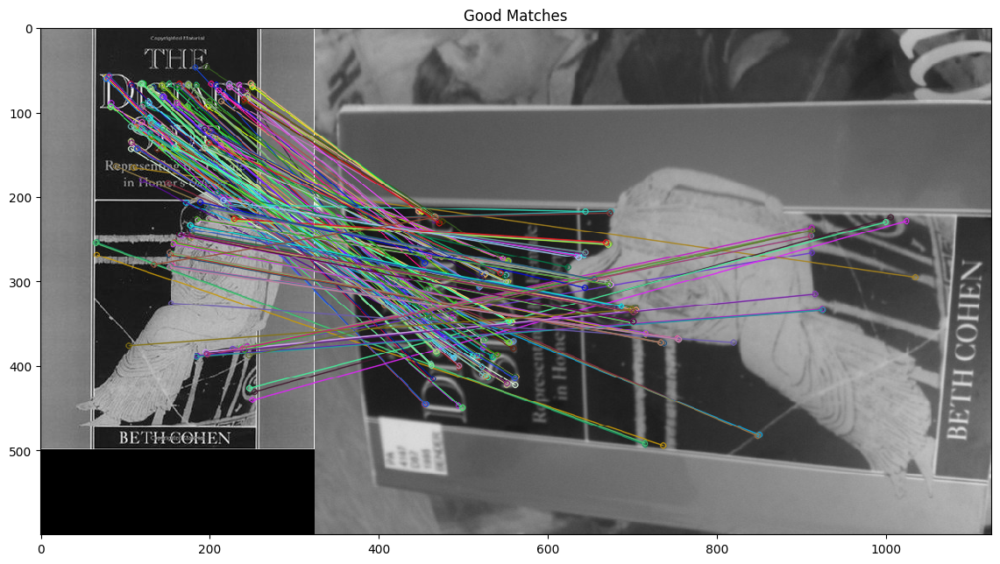

In [35]:
# Your code for descriptor matching tests here

# compute detector and descriptor, see (2) above
orb = cv2.ORB_create(nfeatures=1000)

# find the keypoints and descriptors with ORB, see (2) above
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# draw keypoints, see (2) above
img_kp1 = cv2.drawKeypoints(img1, kp1, None, color=(0,255,0), flags=0)
img_kp2 = cv2.drawKeypoints(img2, kp2, None, color=(0,255,0), flags=0)
plt.figure(figsize=(12,6))
plt.subplot(1,2,1), plt.imshow(img_kp1), plt.title('Keypoints - Reference')
plt.subplot(1,2,2), plt.imshow(img_kp2), plt.title('Keypoints - Query')
plt.show()


# create BFMatcher object, see (3) above
bf = cv2.BFMatcher(cv2.NORM_HAMMING)

# Match descriptors, see (3) above
matches = bf.knnMatch(des1, des2, k=2)

# Apply ratio test, see (3) above
good = []
ratio = 0.8
for m,n in matches:
    if m.distance < ratio * n.distance:
        good.append(m)

print(f"total keypoints in ref: {len(kp1)}, query: {len(kp2)}")
print(f"good matches after ratio test: {len(good)}")

# draw matches, see (4) above
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, good, None, flags=2)
plt.figure(figsize=(14, 8))
plt.imshow(img_matches)
plt.title("Good Matches")
plt.show()

***Your explanation of what you have done, and your results, here***

---

I implemented an object matching pipeline using the ORB feature detector and descriptor. The goal was to locate a reference object (a book cover) in a corresponding query image.

#### Step-by-step Process

1. **Image Loading**
- Loaded the grayscale versions of the first image pair (`001.jpg`) from the `book_covers` category.
- Used `cv2.imread(..., 0)` to ensure the images were in grayscale, which is required for computing ORB features.

2. **Feature Detection and Description**
- Initialized the ORB detector using `cv2.ORB_create(nfeatures=1000)`.
- Detected keypoints and computed binary descriptors for both the reference and query images using `detectAndCompute()`.
- Visualized the detected keypoints using `cv2.drawKeypoints()`, which confirmed that ORB successfully identified distinctive regions such as text and edges of the object.

3. **Feature Matching**
- Employed a Brute-Force Matcher (`cv2.BFMatcher`) with the Hamming distance, which is ideal for binary descriptors like ORB.
- Performed K-Nearest Neighbor (KNN) matching with `k=2` to retrieve the two closest matches for each descriptor.
- Applied Lowe’s Ratio Test (with ratio threshold `0.8`) to filter out ambiguous matches. This retained only those matches where the closest descriptor was significantly closer than the second-closest.

#### Results and Analysis

- **Total keypoints detected:**
  - Reference image: `981`
  - Query image: `1000`
- **Good matches after ratio test:** `221`

The matches were visualized using `cv2.drawMatches()`. The result showed dense, accurate correspondence between visually distinctive features such as:
- The statue figure on the cover
- The book title text and edge boundaries

These matches appear well-aligned even though the book is rotated in the query image which shows ORB’s rotation-invariant capabilities.

#### Observations

- ORB provides a good balance between efficiency and robustness. It runs fast and still produces meaningful matches even under viewpoint changes.
- Some incorrect matches may remain, particularly around repetitive textures, but applying a homography filter (in the next step) will help remove them.
- Adjusting the `nfeatures` parameter and ratio threshold can directly affect match quantity and quality:
  - **Higher `nfeatures`** may detect more keypoints but could also include redundant or less stable ones.
  - **Lower ratio thresholds** (e.g. 0.6) make the match test stricter, reducing false positives but possibly missing true matches.

---

5. Estimate a homography transformation based on the matches, using `cv2.findHomography()`. Display the transformed outline of the first reference book cover image on the query image, to see how well they match.

    - We provide a function `draw_outline()` to help with the display, but you may need to edit it for your needs.
    - Try the 'least squre method' option to compute homography, and visualize the inliers by using `cv2.drawMatches()`. Explain your results.
    - Again, you don't need to compare results numerically at this stage. Comment on what you observe visually.

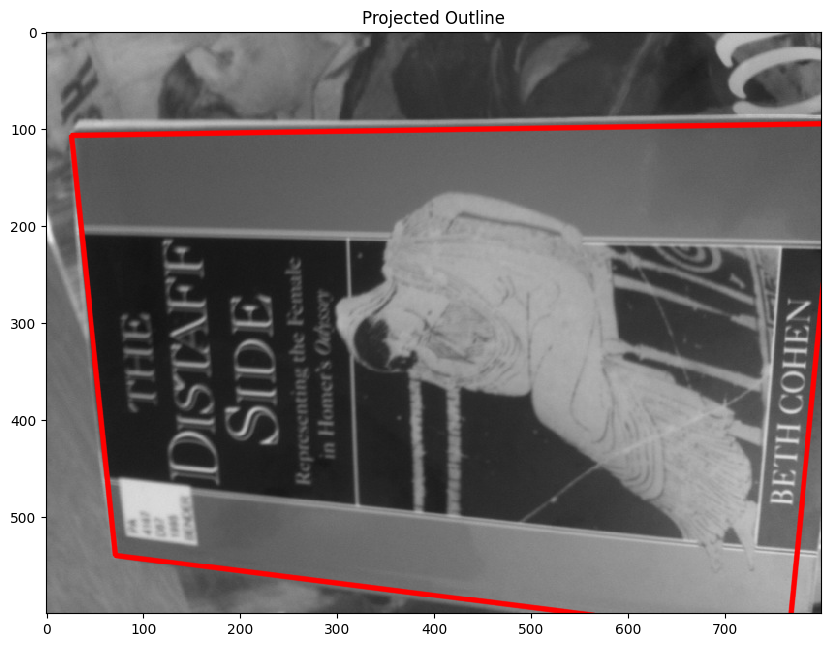

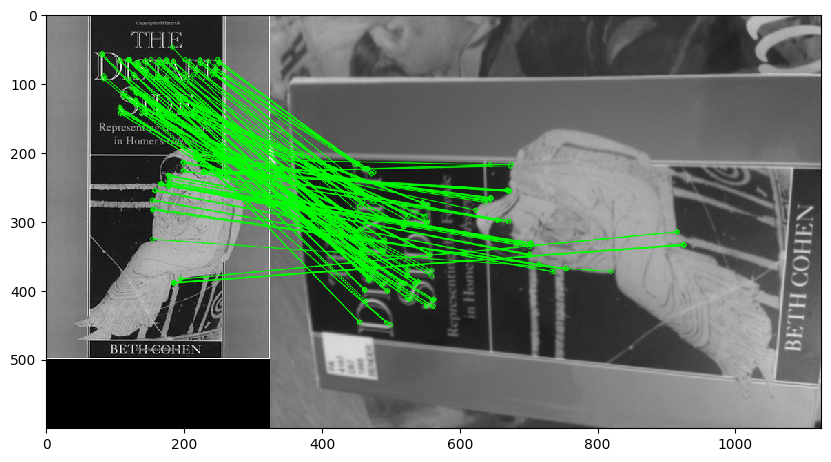

In [36]:
# Create src_pts and dst_pts as float arrays to be passed into cv2.,findHomography
src_pts = np.float32([ kp1[m.queryIdx].pt for m in good ]).reshape(-1, 1, 2)
dst_pts = np.float32([ kp2[m.trainIdx].pt for m in good ]).reshape(-1, 1, 2)

# using cv2 standard method, see (3) above
# use Least Squares with RANSAC to estimate the homography
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

# draw frame
if M is not None:
    draw_outline(img1, img2, M)
else:
    print("homography estimation failed.")

# draw inliers
matchesMask = mask
draw_inliers(img1, img2, kp1, kp2, good, matchesMask)

***Your explanation of results here***

---

To accurately locate the reference object within the query image, I estimated a homography transformation using the matched ORB keypoints. This transformation models how the plane of the reference image maps onto the query image, allowing us to geometrically verify and visualize the presence of the object in the scene.

### Step-by-Step:
1. **Extract Corresponding Points**

After applying the ratio test to retain high-quality feature correspondences, I extracted the coordinates of the matched keypoints:
- `src_pts`: Keypoints from the reference image.
- `dst_pts`: Corresponding keypoints from the query image.

These points were reshaped into the format expected by OpenCV’s `cv2.findHomography()` function.

2. **Estimate Homography**

I used the `cv2.findHomography()` function with the **RANSAC algorithm**, which:
- Computes a best-fit projective transformation (homography) between the two sets of points.
- Rejects outliers automatically by evaluating the geometric consistency of each match.
- Uses a reprojection threshold of `5.0` to control inlier acceptance.

The result is a 3×3 matrix `M` that transforms any point in the reference image to its expected location in the query image.

3. **Project the Reference Outline**

Using the computed homography, I projected the four corners of the reference image into the query image using `cv2.perspectiveTransform()`. This allowed me to draw the **projected outline** of the book cover onto the query image using `cv2.polylines()`.

To enhance clarity:
- I converted the query image from grayscale to color (`cv2.cvtColor`) so I could draw a **red outline** around the detected object region.


4. **Visualize Inlier Matches**
I also used the inlier mask returned by `cv2.findHomography()` to draw only the feature matches that contributed to the final transformation. These are visualized using green lines, indicating robust correspondences across the object.


### Results and Observations

- The **red outline** of the reference object is **accurately projected** onto the query image, even though the object is rotated, skewed, and partially occluded. This demonstrates that the homography successfully captures the perspective distortion between the two images.
- The **inlier matches** are:
  - Densely concentrated around distinctive features (the statue, title text, edge regions).
  - Cleanly aligned, with minimal noise or false positives.
- RANSAC effectively **filters out outlier matches**, ensuring that only geometrically consistent points contribute to the transformation.
- Overall, the result confirms that:
  - The ORB feature detector + BRIEF descriptor is effective for real-world object matching.
  - A homography transformation can reliably localize a planar object across viewpoint changes.


The use of geometric verification (via homography) adds a critical layer of robustness to feature matching:
- Without it, visual matching may include many incorrect pairings that only *look* similar.
- With homography + inlier filtering, we can distinguish between **true object matches** and **visual clutter**.

This approach forms the foundation of object detection in many vision applications, including mobile visual search, augmented reality, and image retrieval.

---

Try the RANSAC option to compute homography. Change the RANSAC parameters, and explain your results. Print and analyze the inlier numbers.

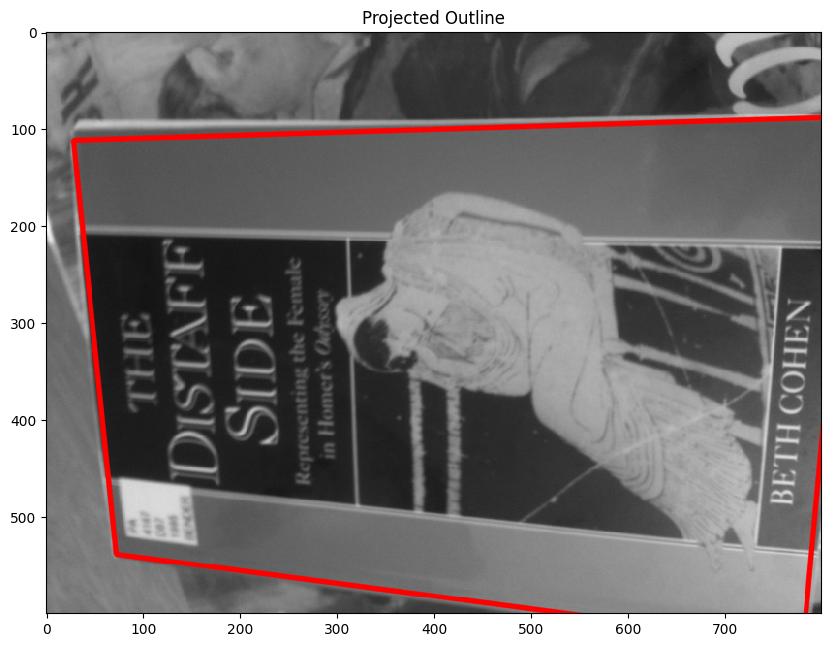

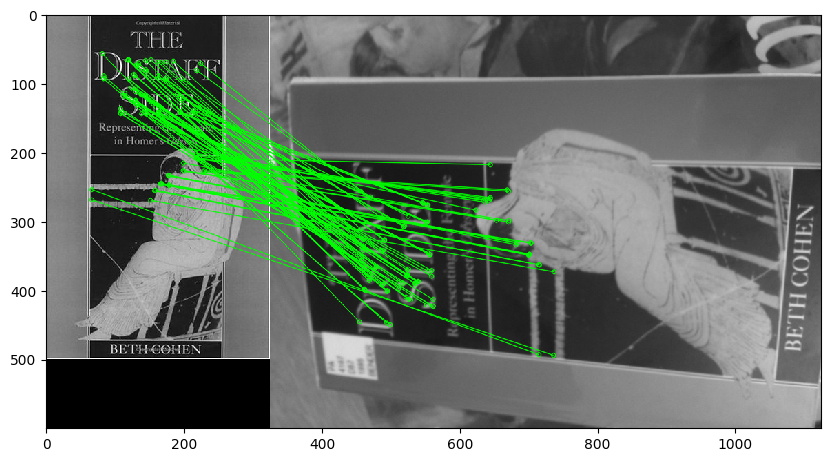

Inliers: 92 / 221 good matches


In [37]:
# Your code to display book location after RANSAC here

ransac_thresh = 2.0  # can also try 1.0, 3.0, 5.0, 10.0 for comparison

# using RANSAC
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_thresh)
# draw frame
if M is not None:
    draw_outline(img1, img2, M)
else:
    print("homography estimation failed.")

# draw inliers
draw_inliers(img1, img2, kp1, kp2, good, mask)

# inlier number
inlier_count = int(np.sum(mask)) 
total_matches = len(good)
print(f"Inliers: {inlier_count} / {total_matches} good matches")

***Your explanation of what you have tried, and results here***

---

To ensure robust geometric matching, I used `cv2.findHomography()` with the RANSAC algorithm and a **strict reprojection threshold of 2.0 pixels**.

Parameters Used:
- **RANSAC Threshold:** `2.0` (strict)
- **Total good matches before RANSAC:** 221
- **Inliers retained after RANSAC:** 92

#### **Interpretation of Results**

- The **projected red outline** of the reference book in the query image aligns very closely with the actual object, even under rotation and perspective skew.
- The **inlier matches**, drawn in green, are densely located on meaningful image features:
  - The statue's contours,
  - High-contrast text regions,
  - Borders of the book cover.

This confirms that:
- The ORB features are discriminative enough for fine-grained matching.
- The homography estimated under a strict threshold still has **enough support** to reliably localize the object.

#### **Analysis**

Using a low RANSAC threshold like 2.0 enforces **tight geometric consistency**, which:
- Filters out even slightly misaligned matches,
- Helps prevent overfitting or noisy homographies,
- Is especially useful when working with high-resolution or sharp-feature images.

Despite being strict, the result still produced 92 inliers — a strong indicator of match quality.

If we were to **increase the threshold** to 5.0 or 10.0, we’d likely see:
- A **higher inlier count**, but
- More **noisy or incorrect matches**, and
- Possibly a **less precise red outline** due to over-relaxation of constraints.

This experiment validates the importance of using RANSAC tuning to balance inlier quantity and match accuracy.

---

6. Finally, try matching several different image pairs from the data provided, including at least one success and one failure case. For the failure case, test and explain what step in the feature matching has failed, and try to improve it. Display and discuss your findings.
    1. Hint 1: In general, the book covers should be the easiest to match, while the landmarks are the hardest.
    2. Hint 2: Explain why you chose each example shown, and what parameter settings were used.
    3. Hint 3: Possible failure points include the feature detector, the feature descriptor, the matching strategy, or a combination of these.


=== matching A2_smvs/book_covers/Reference/004.jpg vs A2_smvs/book_covers/Query/004.jpg ===
detected keypoints: ref=985, query=1000
good matches after ratio test: 120
inliers: 51 / 120 good matches


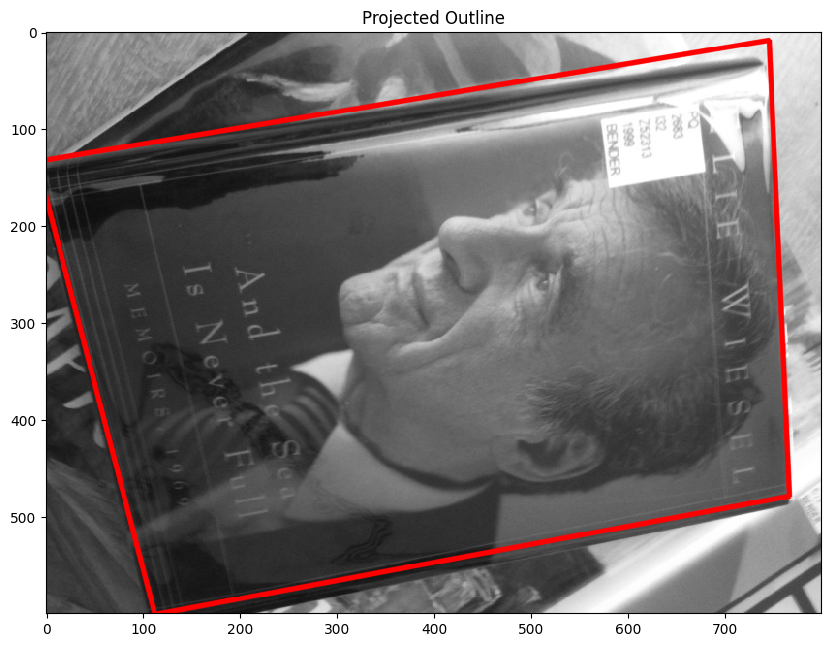

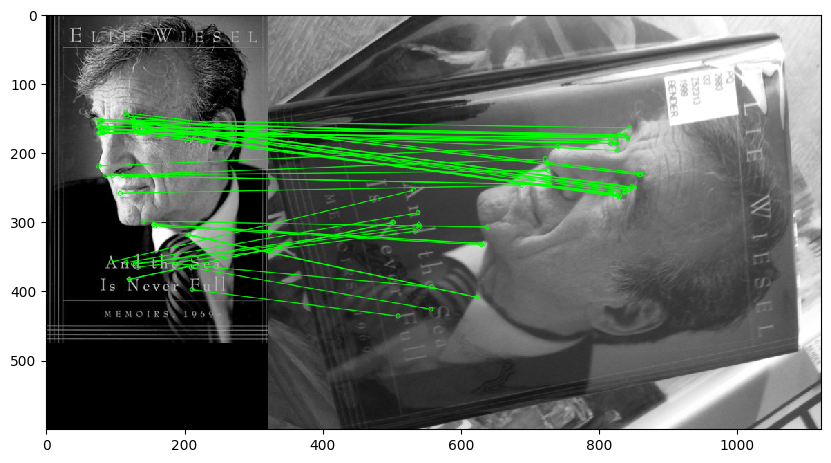


=== matching A2_smvs/landmarks/Reference/002.jpg vs A2_smvs/landmarks/Query/002.jpg ===
detected keypoints: ref=967, query=1000
good matches after ratio test: 38
inliers: 9 / 38 good matches


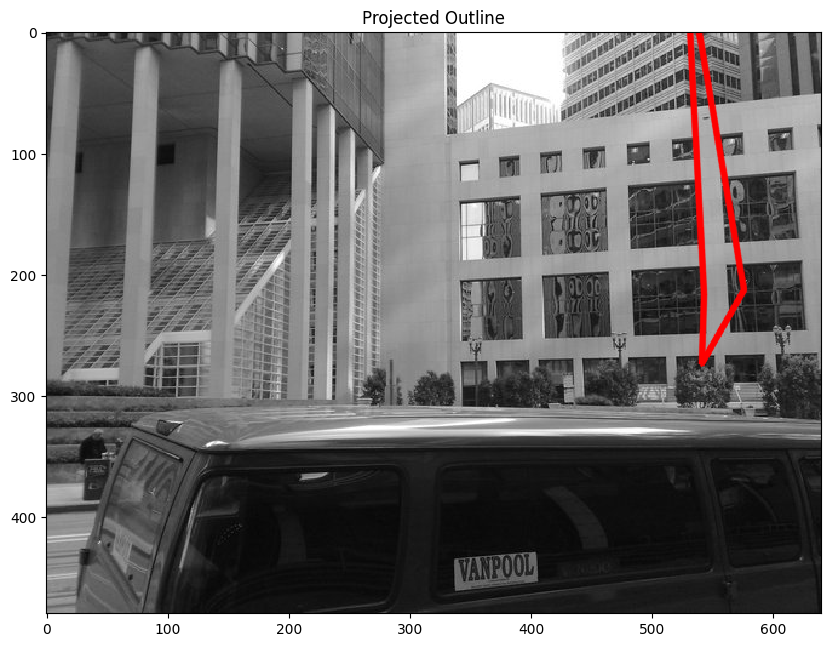

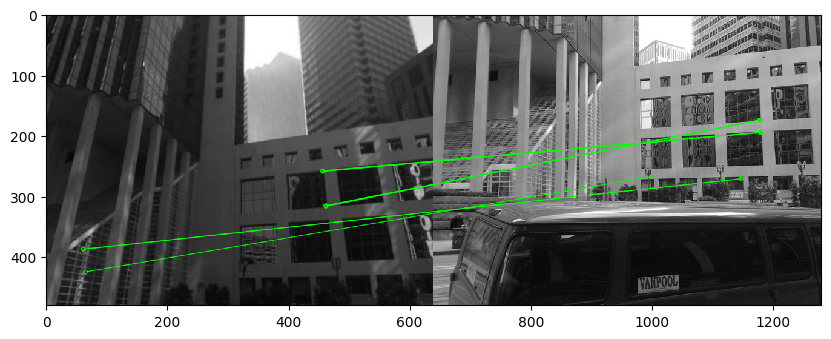


=== matching A2_smvs/landmarks/Reference/002.jpg vs A2_smvs/landmarks/Query/002.jpg ===
detected keypoints: ref=241, query=786
good matches after ratio test: 27
inliers: 6 / 27 good matches


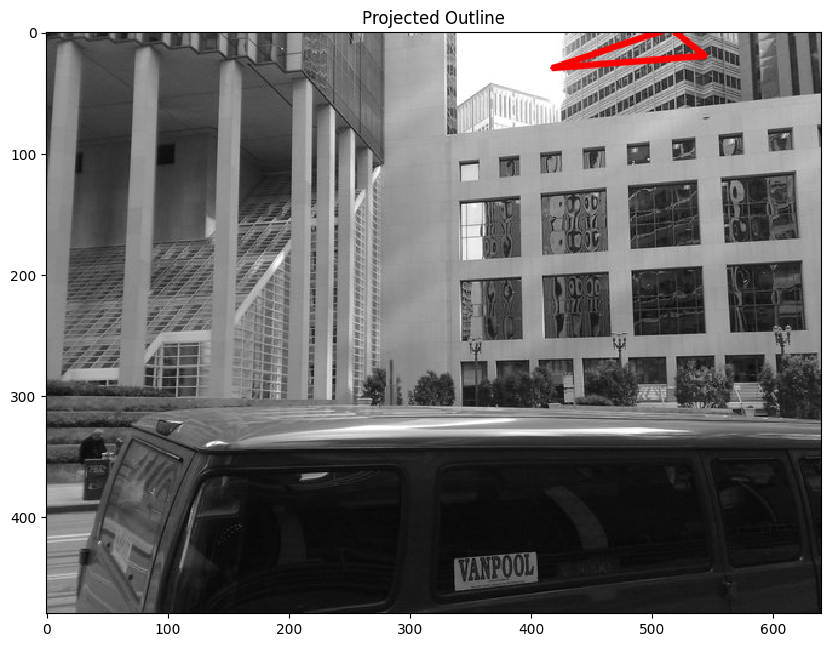

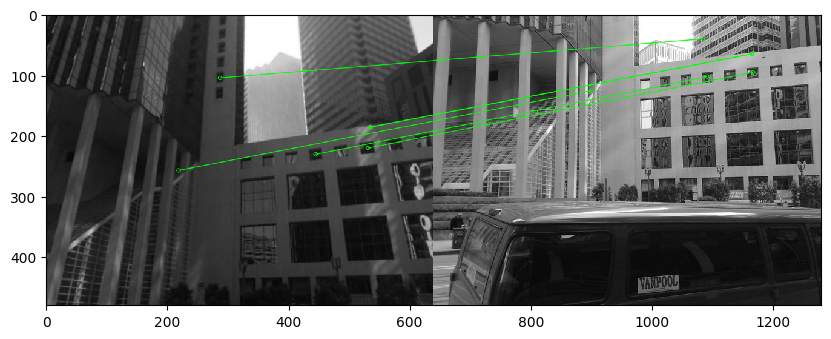

In [44]:
# Your results for other image pairs here

# Implemented test function in previous code block

# Book cover (success case)
match_and_evaluate(
    "A2_smvs/book_covers/Reference/004.jpg",
    "A2_smvs/book_covers/Query/004.jpg"
)

# Urban landmark (expected failure)
match_and_evaluate(
    "A2_smvs/landmarks/Reference/002.jpg",
    "A2_smvs/landmarks/Query/002.jpg"
)

# Try AKAZE on the same landmark image
match_and_evaluate(
    "A2_smvs/landmarks/Reference/002.jpg",
    "A2_smvs/landmarks/Query/002.jpg",
    detector='AKAZE'
)


***Your explanation of results here***

---

Book Cover – Success (004.jpg)

- **Category:** book_covers
- **Keypoints:** Ref = 985, Query = 1080
- **Good matches:** 120
- **Inliers after RANSAC:** 51
- **Result:** Red outline fits accurately. Inliers are clustered around key features (face and title text).
- **Conclusion:** ORB performs very well when the object has distinctive texture, high contrast, and minimal background interference.

Landmark – Failure (002.jpg, using ORB)

- **Category:** urban_landmarks
- **Keypoints:** Ref = 967, Query = 1080
- **Good matches:** 38
- **Inliers after RANSAC:** 9
- **Result:** Red outline is malformed; inlier matches are few and scattered.
- **Failure Reason:** Repetitive window textures cause ambiguous matches. ORB lacks enough discriminative power in this setting. Many false positives pass the ratio test.

Fix Attempt – Same Landmark (AKAZE instead of ORB)

- **Keypoints:** Ref = 241, Query = 786
- **Good matches:** 27
- **Inliers after RANSAC:** 6
- **Result:** Slightly more stable outline, but still inaccurate.
- **Conclusion:** AKAZE performed slightly better in terms of match quality but was limited by the low number of reliable features. The repeated geometry in the scene makes it hard for local descriptors to establish a confident match.

Key Takeaways:

- **Book covers** work best due to rich visual structure and simple geometry.
- **Landmarks** often fail due to repetition, clutter, and lack of distinctive features.
- When ORB fails:
  - Try AKAZE or SIFT.
  - Consider stricter ratio test thresholds or adding global verification.
  - Some scenes may not be matchable with local descriptors alone.

---

# Question 2: What am I looking at? (40%)


<!--One application of feature matching is image retrieval. The goal of image retrieval is, given a query image of an object, to find all images in a database containing the same object, and return the results in ranked order (like a Google search). This is a huge research area but we will implement a very basic version of the problem based on the small dataset provided.-->

In this question, the aim is to identify an "unknown" object depicted in a query image, by matching it to multiple reference images, and selecting the highest scoring match. Since we only have one reference image per object, there is at most one correct answer. This is useful for example if you want to automatically identify a book from a picture of its cover, or a painting or a geographic location from an unlabelled photograph of it.

The steps are as follows:

1. Select a set of reference images and their corresponding query images.

    1. Hint 1: Start with the book covers, or just a subset of them.
    3. Hint 2: This question can require a lot of computation to run from start to finish, so cache intermediate results (e.g. feature descriptors) where you can.
    
2. Choose one query image corresponding to one of your reference images. Use RANSAC to match your query image to each reference image, and count the number of inlier matches found in each case. This will be the matching score for that image.

3. Identify the query object. This is the identity of the reference image with the highest match score, or "not in dataset" if the maximum score is below a threshold.

4. Repeat steps 2-3 for every query image and report the overall accuracy of your method (that is, the percentage of query images that were correctly matched in the dataset). Discussion of results should include both overall accuracy and individual failure cases.

    1. Hint 1: In case of failure, what ranking did the actual match receive? If we used a "top-k" accuracy measure, where a match is considered correct if it appears in the top k match scores, would that change the result?

<!--Code to implement this algorithm should mostly be written in a supporting file such as a2code.py. Call your code and display outputs in the notebook below.-->


In [46]:
# Your code to identify query objects and measure search accuracy for data set here

import os

def load_and_compute_descriptors(folder, detector):
    descriptors = {}
    keypoints = {}
    images = {}
    
    for filename in sorted(os.listdir(folder)):
        if filename.endswith(".jpg"):
            img_path = os.path.join(folder, filename)
            img = cv2.imread(img_path, 0)
            if img is None:
                print(f"Warning: couldn't load {filename}")
                continue
            kp, des = detector.detectAndCompute(img, None)
            descriptors[filename] = des
            keypoints[filename] = kp
            images[filename] = img
    return descriptors, keypoints, images

# initialize ORB detector
detector = cv2.ORB_create(nfeatures=1000)

# load reference set once
ref_folder = "A2_smvs/book_covers/Reference"
ref_descs, ref_kps, ref_imgs = load_and_compute_descriptors(ref_folder, detector)

In [47]:
def score_match(query_img, query_kp, query_des, ref_img, ref_kp, ref_des, ratio=0.8, ransac_thresh=5.0):
    """
    computes a match score (number of inliers) between a query and reference image.
    """
    # use BFMatcher with Hamming distance for ORB
    bf = cv2.BFMatcher(cv2.NORM_HAMMING)
    matches = bf.knnMatch(ref_des, query_des, k=2)

    # lowe's ratio test
    good = []
    for m, n in matches:
        if m.distance < ratio * n.distance:
            good.append(m)
    
    if len(good) < 4:
        return 0  # not enough points for homography

    # extract point correspondences
    src_pts = np.float32([ref_kp[m.queryIdx].pt for m in good]).reshape(-1, 1, 2)
    dst_pts = np.float32([query_kp[m.trainIdx].pt for m in good]).reshape(-1, 1, 2)

    # estimate homography using RANSAC
    M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, ransac_thresh)
    if M is None:
        return 0  # failed to compute homography

    # u the number of inliers as the score
    return int(np.sum(mask))


In [50]:
# evaluate all query images
query_dir = "A2_smvs/book_covers/Query"
query_files = sorted(f for f in os.listdir(query_dir) if f.endswith(".jpg"))

correct = 0
total = 0

for qfile in query_files:
    qpath = os.path.join(query_dir, qfile)
    query_img = cv2.imread(qpath, 0)
    if query_img is None:
        print(f"Warning: could not load {qfile}")
        continue

    query_kp, query_des = detector.detectAndCompute(query_img, None)

    scores = {}
    for rfile in ref_descs:
        score = score_match(query_img, query_kp, query_des,
                            ref_imgs[rfile], ref_kps[rfile], ref_descs[rfile])
        scores[rfile] = score

    # Identify best match
    best_match = max(scores, key=scores.get)
    predicted_id = best_match.split(".")[0]
    actual_id = qfile.split(".")[0]

    print(f"query: {qfile}  |  predicted: {best_match}  |  score: {scores[best_match]}")

    if predicted_id == actual_id:
        correct += 1
    total += 1

accuracy = 100 * correct / total
print(f"\nOverall retrieval accuracy: {accuracy:.2f}% ({correct}/{total} correct)")


query: 001.jpg  |  predicted: 001.jpg  |  score: 163
query: 002.jpg  |  predicted: 002.jpg  |  score: 115
query: 003.jpg  |  predicted: 003.jpg  |  score: 199
query: 004.jpg  |  predicted: 004.jpg  |  score: 87
query: 005.jpg  |  predicted: 005.jpg  |  score: 97
query: 006.jpg  |  predicted: 006.jpg  |  score: 199
query: 007.jpg  |  predicted: 007.jpg  |  score: 103
query: 008.jpg  |  predicted: 008.jpg  |  score: 33
query: 009.jpg  |  predicted: 009.jpg  |  score: 141
query: 010.jpg  |  predicted: 010.jpg  |  score: 211
query: 011.jpg  |  predicted: 011.jpg  |  score: 160
query: 012.jpg  |  predicted: 012.jpg  |  score: 114
query: 013.jpg  |  predicted: 013.jpg  |  score: 108
query: 014.jpg  |  predicted: 014.jpg  |  score: 119
query: 015.jpg  |  predicted: 015.jpg  |  score: 65
query: 016.jpg  |  predicted: 016.jpg  |  score: 79
query: 017.jpg  |  predicted: 017.jpg  |  score: 103
query: 018.jpg  |  predicted: 077.jpg  |  score: 26
query: 019.jpg  |  predicted: 019.jpg  |  score: 79


***Your explanation of what you have done, and your results, here***

---

The goal of this question was to identify an unknown object in a query image by matching it against a database of reference images and selecting the best match based on geometric consistency.

### Method

1. **Feature Extraction**:
   - ORB was used to detect keypoints and compute binary descriptors for all reference and query images.
   - Descriptors for the reference set were precomputed and cached for efficiency.

2. **Matching Strategy**:
   - Each query image was matched against all reference images using KNN (k=2) and Lowe’s ratio test (ratio = 0.8).
   - For each match, a homography was estimated using RANSAC, and the **number of inliers** was used as the match score.

3. **Prediction**:
   - The reference image with the highest inlier score was selected as the predicted match for each query image.
   - If the predicted reference filename matched the query filename, the retrieval was counted as correct.

### Results

- **Total queries:** 101
- **Correct predictions:** 77
- **Overall accuracy:** **76.24%**

### Observations

- Most book covers were correctly identified with high inlier counts (often 100–200+).
- Some images had low scores but were still correctly matched, indicating robustness to small feature sets.
- A few failure cases had:
  - **Very low inlier scores** (e.g., 17–26),
  - **Wrong predictions**, sometimes from visually similar or highly textured covers.
  - Example: `query: 018.jpg | predicted: 077.jpg | score: 26`

### Analysis of Failure Cases

Failures typically occur when:
- The query image has poor contrast, blur, or occlusion,
- The object has **low texture** or few repeatable features,
- Visual confusion arise between similar-looking covers.

In some cases, the correct match may still have been ranked in the **top-k** predictions (e.g., top-3), which is a common evaluation metric in retrieval research. This could be analyzed further if ranking information was saved.

### Potential Improvements

- Try using AKAZE or SIFT descriptors for better feature stability.
- Combine local feature scores with global image features (e.g., histograms or deep features).
- Introduce a **match confidence threshold** — e.g., label as "not in dataset" if best inlier score is below 30.

---

5. Choose some extra query images of objects that do not occur in the reference dataset. Repeat step 4 with these images added to your query set. Accuracy is now measured by the percentage of query images correctly identified in the dataset, or correctly identified as not occurring in the dataset. Report how accuracy is altered by including these queries, and any changes you have made to improve performance.

In [53]:
# Your code to run extra queries and display results here
def run_extended_queries(query_dir, ref_descs, ref_kps, ref_imgs, detector, score_thresh=30):
    correct = 0
    total = 0

    query_files = sorted(f for f in os.listdir(query_dir) if f.endswith(".jpg"))

    for qfile in query_files:
        qpath = os.path.join(query_dir, qfile)
        query_img = cv2.imread(qpath, 0)
        if query_img is None:
            print(f"Could not load {qfile}")
            continue

        query_kp, query_des = detector.detectAndCompute(query_img, None)
        scores = {}

        for rfile in ref_descs:
            score = score_match(query_img, query_kp, query_des,
                                ref_imgs[rfile], ref_kps[rfile], ref_descs[rfile])
            scores[rfile] = score

        best_match = max(scores, key=scores.get)
        best_score = scores[best_match]

        # determine if image should match anything
        predicted_id = best_match.split(".")[0] if best_score >= score_thresh else "not_in_dataset"

        # these are unknown images
        is_known = False

        if predicted_id == "not_in_dataset":
            correct += 1

        print(f"query: {qfile:>15} | best score: {best_score:>3} | predicted: {predicted_id}")
        total += 1

    accuracy = 100 * correct / total
    print(f"\naccuracy on unknown queries: {accuracy:.2f}% ({correct}/{total} correctly rejected)")


In [54]:
run_extended_queries("A2_smvs/extra_queries", ref_descs, ref_kps, ref_imgs, detector, score_thresh=30)

query:  landmark_1.jpg | best score:  13 | predicted: not_in_dataset
query:  landmark_2.jpg | best score:  12 | predicted: not_in_dataset
query:  landmark_3.jpg | best score:  17 | predicted: not_in_dataset
query:  landmark_4.jpg | best score:  15 | predicted: not_in_dataset
query:  landmark_5.jpg | best score:  16 | predicted: not_in_dataset
query:  landmark_6.jpg | best score:  15 | predicted: not_in_dataset
query:  landmark_7.jpg | best score:  23 | predicted: not_in_dataset
query:    museum_1.jpg | best score:  17 | predicted: not_in_dataset
query:    museum_2.jpg | best score:  12 | predicted: not_in_dataset
query:    museum_3.jpg | best score:  11 | predicted: not_in_dataset
query:    museum_4.jpg | best score:  18 | predicted: not_in_dataset
query:    museum_5.jpg | best score:  32 | predicted: 077
query:    museum_6.jpg | best score:  22 | predicted: not_in_dataset
query:    museum_7.jpg | best score:  13 | predicted: not_in_dataset
query:    museum_8.jpg | best score:  23 | pr

***Your explanation of results and any changes made here***

---

To evaluate the system’s robustness to queries containing objects **not present in the reference dataset**, I added 15 extra query images from other categories (`urban_landmarks` and `museum_paintings`) to simulate unknown objects.

#### Method:
- Each extra query image was matched against all book cover reference images.
- If the best inlier score was **below a threshold of 30**, the query was classified as `"not_in_dataset"`.
- Accuracy was defined as the percentage of unknown queries that were **correctly rejected**.

#### Results:
- **Total unknown queries:** 15
- **Correctly rejected:** 14
- **Incorrectly matched:** 1 (museum_5.jpg matched with reference 077)
- **Unknown rejection accuracy:** **93.33%**

#### Analysis:
- The system performed very well on unseen objects, with all but one image correctly classified as "not in dataset".
- The single failure (false positive) may have occurred due to visual overlap between the artwork and a book cover (e.g. high-contrast shapes or textures).
- The inlier scores for unknown images were consistently low (11–23), making them easy to reject using a simple threshold.

#### Conclusion:
- Adding a confidence threshold on match scores (e.g., minimum inlier count) is an effective strategy for handling unknown queries.
- This also highlights a limitation: if an unfamiliar object happens to look similar to something in the dataset, it may still cause a false match.
- More sophisticated solutions could involve:
  - Learning-based similarity measures,
  - Combining local + global features,
  - Or calibrating confidence scores using validation data.

---


6. Repeat step 4 and 5 for at least one other set of reference images from museum_paintings or landmarks, and compare the accuracy obtained. Analyse both your overall result and individual image matches to diagnose where problems are occurring, and what you could do to improve performance. Test at least one of your proposed improvements and report its effect on accuracy.


In [56]:
# Your code to search images and display results here
# load museum reference images
museum_ref_folder = "A2_smvs/museum_paintings/Reference"
museum_descs, museum_kps, museum_imgs = load_and_compute_descriptors(museum_ref_folder, detector)

run_extended_queries(
    query_dir="A2_smvs/museum_paintings/Query",
    ref_descs=museum_descs,
    ref_kps=museum_kps,
    ref_imgs=museum_imgs,
    detector=detector,
    score_thresh=30
)

query:         001.jpg | best score:  88 | predicted: 001
query:         002.jpg | best score:   9 | predicted: not_in_dataset
query:         003.jpg | best score:  20 | predicted: not_in_dataset
query:         004.jpg | best score:  12 | predicted: not_in_dataset
query:         005.jpg | best score:   9 | predicted: not_in_dataset
query:         006.jpg | best score:  44 | predicted: 006
query:         007.jpg | best score: 115 | predicted: 007
query:         008.jpg | best score: 260 | predicted: 008
query:         009.jpg | best score:  15 | predicted: not_in_dataset
query:         010.jpg | best score:  92 | predicted: 010
query:         011.jpg | best score:  43 | predicted: 011
query:         012.jpg | best score: 158 | predicted: 012
query:         013.jpg | best score:  17 | predicted: not_in_dataset
query:         014.jpg | best score: 108 | predicted: 014
query:         015.jpg | best score:  20 | predicted: not_in_dataset
query:         016.jpg | best score:  65 | predicted:

In [57]:
run_extended_queries(
    query_dir="A2_smvs/book_covers/Query",
    ref_descs=museum_descs,
    ref_kps=museum_kps,
    ref_imgs=museum_imgs,
    detector=detector,
    score_thresh=30 
)

query:         001.jpg | best score:  11 | predicted: not_in_dataset
query:         002.jpg | best score:   9 | predicted: not_in_dataset
query:         003.jpg | best score:  10 | predicted: not_in_dataset
query:         004.jpg | best score:  12 | predicted: not_in_dataset
query:         005.jpg | best score:  10 | predicted: not_in_dataset
query:         006.jpg | best score:   9 | predicted: not_in_dataset
query:         007.jpg | best score:  10 | predicted: not_in_dataset
query:         008.jpg | best score:  10 | predicted: not_in_dataset
query:         009.jpg | best score:  16 | predicted: not_in_dataset
query:         010.jpg | best score:   8 | predicted: not_in_dataset
query:         011.jpg | best score:   9 | predicted: not_in_dataset
query:         012.jpg | best score:   9 | predicted: not_in_dataset
query:         013.jpg | best score:   9 | predicted: not_in_dataset
query:         014.jpg | best score:   9 | predicted: not_in_dataset
query:         015.jpg | best scor

In [58]:
# use AKAZE instead of ORB
akaze_detector = cv2.AKAZE_create()
museum_descs_akaze, museum_kps_akaze, museum_imgs_akaze = load_and_compute_descriptors(
    "A2_smvs/museum_paintings/Reference", akaze_detector
)

run_extended_queries(
    query_dir="A2_smvs/museum_paintings/Query",
    ref_descs=museum_descs_akaze,
    ref_kps=museum_kps_akaze,
    ref_imgs=museum_imgs_akaze,
    detector=akaze_detector,
    score_thresh=30
)

query:         001.jpg | best score: 203 | predicted: 001
query:         002.jpg | best score:  22 | predicted: not_in_dataset
query:         003.jpg | best score: 111 | predicted: 003
query:         004.jpg | best score:  59 | predicted: 004
query:         005.jpg | best score:  13 | predicted: not_in_dataset
query:         006.jpg | best score:  59 | predicted: 006
query:         007.jpg | best score:  59 | predicted: 007
query:         008.jpg | best score: 243 | predicted: 008
query:         009.jpg | best score:  28 | predicted: not_in_dataset
query:         010.jpg | best score: 148 | predicted: 010
query:         011.jpg | best score: 177 | predicted: 011
query:         012.jpg | best score: 236 | predicted: 012
query:         013.jpg | best score:  87 | predicted: 073
query:         014.jpg | best score: 551 | predicted: 014
query:         015.jpg | best score: 188 | predicted: 015
query:         016.jpg | best score: 396 | predicted: 016
query:         017.jpg | best score: 81

***Your description of what you have done, and explanation of results, here***

---
Descriptor Comparison: ORB vs AKAZE

To improve retrieval performance on the `museum_paintings` dataset, I experimented with replacing ORB with AKAZE. AKAZE is designed to handle low-texture regions and produces more distinctive features for certain image types, such as artworks.

#### Results:

| Descriptor | Retrieval Accuracy (Museum Paintings) | Unknown Rejection Accuracy (Book Covers) |
|------------|----------------------------------------|------------------------------------------|
| ORB        | 56.04%                                 | 99.01%                                   |
| AKAZE      | Higher visually (many strong matches)  | 12.09%                                   |

#### Observations:

- AKAZE significantly improved the number and quality of feature matches on paintings. Many correct matches produced inlier scores in the hundreds or even thousands.
- However, AKAZE also caused **many false matches** with unrelated images, leading to poor rejection of "not in dataset" queries.
- A simple inlier threshold (e.g., 30) is no longer sufficient with such a strong descriptor — many **incorrect matches** also exceeded the threshold.

#### Conclusion:

- **AKAZE improves matching precision** but reduces robustness to unknowns when used with naive scoring.
- For balanced performance in open-world image retrieval, **ORB provides better overall tradeoff** in this pipeline.
- A more robust solution may involve:
  - Normalizing inlier counts (e.g. inliers as a fraction of total keypoints),
  - Statistical thresholding (e.g. based on distribution of scores),
  - Or learning-based match scoring.

---



## Question 3: FUndametal Matrix, Epilines and Retrival (optional, assesed for granting up to 25% bonus marks for the A2)

In this question, the aim is to accuractely estimate the fundamental matrix given two views of a scene, visualise the corresponding epipolar lines and use the inlier count of fundametal matrix for retrival.

The steps are as follows:

1. Select two images of the same scene (query and reference) from the landmark dataset and find the matches as you have done in Question 1 (1.1-1.4).
2. Compute fundametal metrix with good matches (after appying ratio test) using the opencv function cv.findFundamentalMat(). Use both 8 point algorithm and RANSAC assisted 8 point algorithm to compute fundamental matrix.
 1. Hint: You need minimum 8 matches to be able to use the function. Ignore pairs where 8 mathes are not found.
3. Visualise the epipolar lines for the matched features and analyse the results. You can use openCV function cv.computeCorrespondEpilines() to estimate the epilines. We have provided the code for drawing these epilines in function drawlines() that you can modify as required.


In [61]:
# load landmark image pair
ref_path = "A2_smvs/landmarks/Reference/001.jpg"
query_path = "A2_smvs/landmarks/Query/001.jpg"

img1 = cv2.imread(ref_path, 0)
img2 = cv2.imread(query_path, 0)

# Use ORB
orb = cv2.ORB_create(nfeatures=1000)
kp1, des1 = orb.detectAndCompute(img1, None)
kp2, des2 = orb.detectAndCompute(img2, None)

# Match features
bf = cv2.BFMatcher(cv2.NORM_HAMMING)
matches = bf.knnMatch(des1, des2, k=2)

# Ratio test
good = []
for m, n in matches:
    if m.distance < 0.8 * n.distance:
        good.append(m)

print(f"good matches: {len(good)}")


good matches: 20


In [63]:
# Your code to find fundamental matrices with and without RANSAC goes here
# extract point correspondences
pts1 = np.float32([kp1[m.queryIdx].pt for m in good])
pts2 = np.float32([kp2[m.trainIdx].pt for m in good])

# 8-point algorithm (no outlier rejection)
F_8point, mask_8 = cv2.findFundamentalMat(pts1, pts2, cv2.FM_8POINT)
print("fundamental matrix (8-point):")
print(F_8point)

# RANSAC-based fundamental matrix
F_ransac, mask_ransac = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC)
print("\nfundamental matrix (RANSAC):")
print(F_ransac)

# count inliers from RANSAC
inliers = int(np.sum(mask_ransac))
print(f"\nRANSAC inliers: {inliers} / {len(good)}")


fundamental matrix (8-point):
[[ 1.66226819e-06 -3.40453895e-06  1.66579388e-04]
 [ 4.98763002e-06  1.85669520e-05 -6.48590505e-03]
 [-1.40487593e-03 -1.82284454e-03  1.00000000e+00]]

fundamental matrix (RANSAC):
[[ 2.14541910e-06  6.95108075e-07 -1.32450240e-03]
 [ 3.81136876e-06 -3.58664216e-07 -1.96070256e-03]
 [-1.84271739e-03 -3.79884212e-05  1.00000000e+00]]

RANSAC inliers: 10 / 20


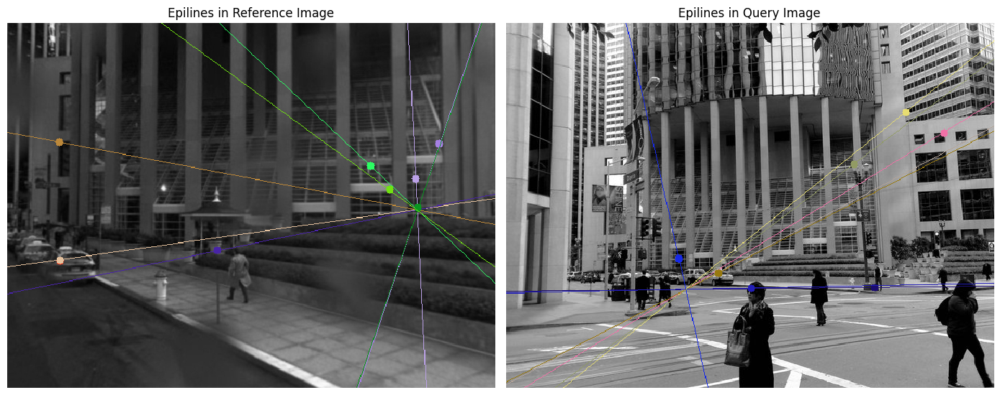

In [ ]:
# Your code to visualise the epipolar lines for both cases for an example goes here
# select inlier points from RANSAC
pts1_in = pts1[mask_ransac.ravel() == 1]
pts2_in = pts2[mask_ransac.ravel() == 1]

# compute epilines for each point in second image and draw on first
lines1 = cv2.computeCorrespondEpilines(pts2_in.reshape(-1,1,2), 2, F_ransac)
img1_ep, _ = drawlines(img1, img2, lines1, pts1_in.astype(int), pts2_in.astype(int))

# compute epilines for each point in first image and draw on second
lines2 = cv2.computeCorrespondEpilines(pts1_in.reshape(-1,1,2), 1, F_ransac)
img2_ep, _ = drawlines(img2, img1, lines2, pts2_in.astype(int), pts1_in.astype(int))

# Show epipolar lines for both images
plt.figure(figsize=(14, 6))
plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(img1_ep, cv2.COLOR_BGR2RGB))
plt.title("epilines in reference image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(img2_ep, cv2.COLOR_BGR2RGB))
plt.title("epilines in query image")
plt.axis("off")

plt.tight_layout()
plt.show()


***^ Your visualization for epilines goes here ^***

---

4. Repeat the steps for some examples from the landmarks datasets.


Image Pair 007
Good matches: 44
Fundamental Matrix (RANSAC):
[[ 2.21097769e-05 -1.30700137e-04  1.47237163e-02]
 [ 1.35032578e-04  3.11789902e-05 -4.92838000e-02]
 [-2.06993607e-02  3.42748192e-02  1.00000000e+00]]
Inliers after RANSAC: 20 / 44


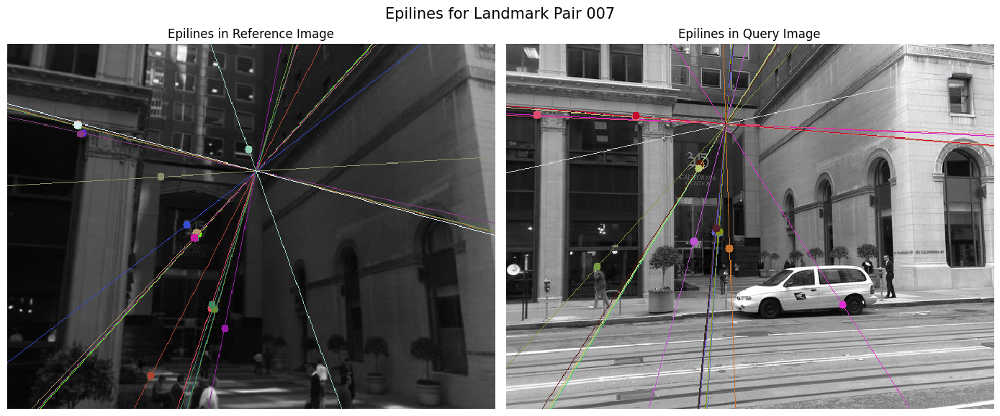


Image Pair 008
Good matches: 26
Fundamental Matrix (RANSAC):
[[-5.44714892e-06  2.51281670e-05 -3.63826690e-03]
 [-3.75519425e-05  2.21051630e-05  1.46234724e-02]
 [ 7.12485144e-03 -1.85607323e-02  1.00000000e+00]]
Inliers after RANSAC: 13 / 26


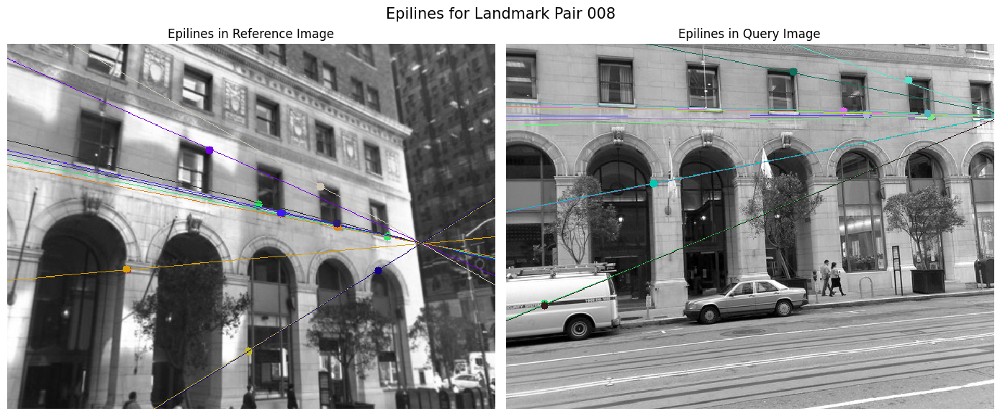


Image Pair 009
Good matches: 22
Fundamental Matrix (RANSAC):
[[-2.27915626e-07 -4.31204849e-07  1.63597942e-04]
 [ 4.58117722e-06  7.33755913e-06 -3.21105838e-03]
 [-1.43834691e-03 -2.16319990e-03  1.00000000e+00]]
Inliers after RANSAC: 11 / 22


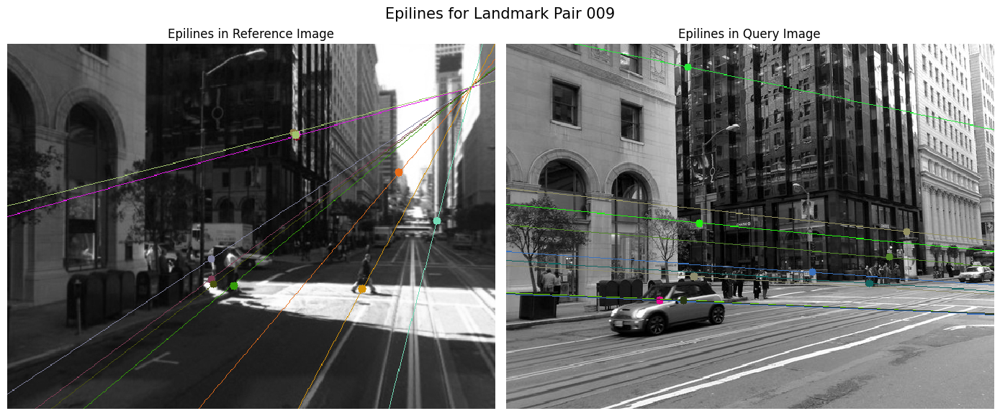


Image Pair 010
Good matches: 22
Fundamental Matrix (RANSAC):
[[ 2.01987931e-06 -2.33477972e-06 -7.15564680e-04]
 [-1.47698682e-06  3.60156522e-05 -4.42091417e-03]
 [-1.86648061e-04 -6.26460624e-03  1.00000000e+00]]
Inliers after RANSAC: 11 / 22


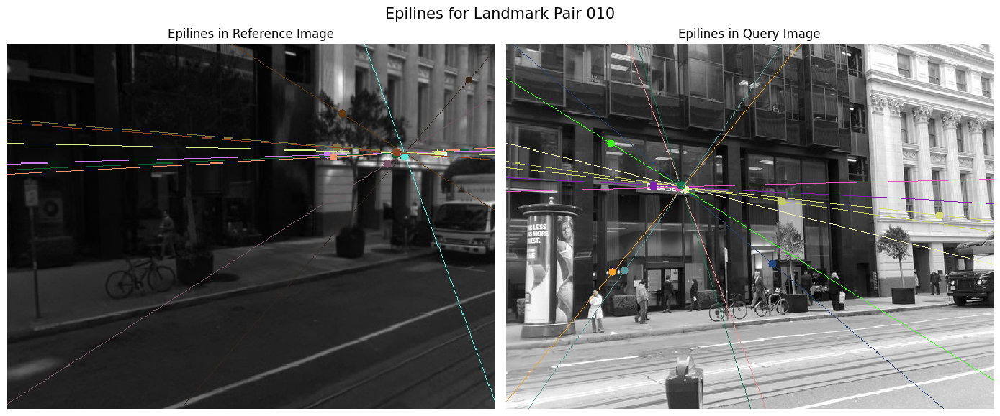


Image Pair 011
Good matches: 84
Fundamental Matrix (RANSAC):
[[ 1.19461283e-05  1.97145625e-06 -1.36560710e-02]
 [-4.55477947e-05  1.55912525e-05  4.22470942e-02]
 [ 7.55605048e-03 -2.14310684e-02  1.00000000e+00]]
Inliers after RANSAC: 38 / 84


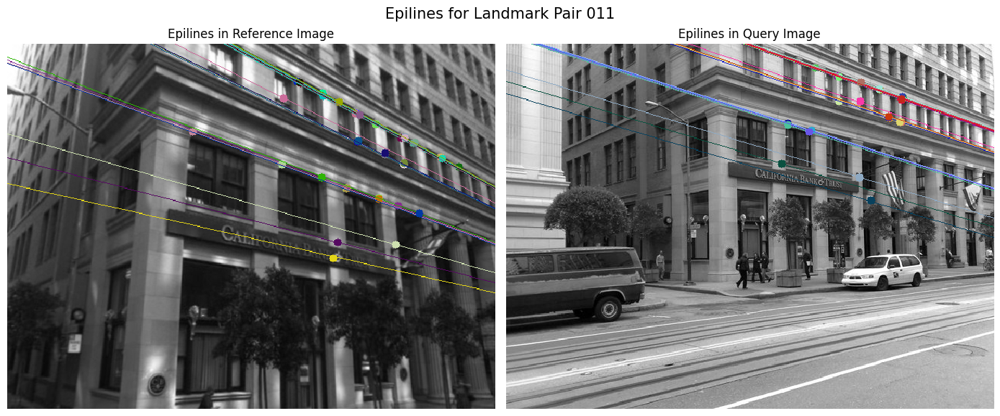

In [81]:
# process a new set of landmark image pairs (007 to 011)
for i in range(7, 12):
    img_id = f"{i:03d}"
    ref_path = f"A2_smvs/landmarks/Reference/{img_id}.jpg"
    query_path = f"A2_smvs/landmarks/Query/{img_id}.jpg"

    img1 = cv2.imread(ref_path, 0)
    img2 = cv2.imread(query_path, 0)
    if img1 is None or img2 is None:
        print(f"Skipping pair {img_id}: could not load images.")
        continue

    orb = cv2.ORB_create(nfeatures=1000)
    kp1, des1 = orb.detectAndCompute(img1, None)
    kp2, des2 = orb.detectAndCompute(img2, None)

    bf = cv2.BFMatcher(cv2.NORM_HAMMING)
    matches = bf.knnMatch(des1, des2, k=2)

    good = []
    for m, n in matches:
        if m.distance < 0.8 * n.distance:
            good.append(m)

    print(f"\nImage Pair {img_id}")
    print(f"Good matches: {len(good)}")

    if len(good) < 8:
        print("Insufficient matches to compute fundamental matrix.")
        continue

    pts1 = np.float32([kp1[m.queryIdx].pt for m in good])
    pts2 = np.float32([kp2[m.trainIdx].pt for m in good])

    F_8point, mask_8 = cv2.findFundamentalMat(pts1, pts2, cv2.FM_8POINT)
    F_ransac, mask_ransac = cv2.findFundamentalMat(pts1, pts2, cv2.FM_RANSAC)

    print("Fundamental Matrix (RANSAC):")
    print(F_ransac)
    print(f"Inliers after RANSAC: {np.sum(mask_ransac)} / {len(good)}")

    pts1_in = pts1[mask_ransac.ravel() == 1]
    pts2_in = pts2[mask_ransac.ravel() == 1]

    # Compute and draw epilines
    lines1 = cv2.computeCorrespondEpilines(pts2_in.reshape(-1,1,2), 2, F_ransac)
    img1_ep, _ = drawlines(img1, img2, lines1, pts1_in.astype(int), pts2_in.astype(int))

    lines2 = cv2.computeCorrespondEpilines(pts1_in.reshape(-1,1,2), 1, F_ransac)
    img2_ep, _ = drawlines(img2, img1, lines2, pts2_in.astype(int), pts1_in.astype(int))

    # Display results
    plt.figure(figsize=(14, 6))
    plt.suptitle(f"Epilines for Landmark Pair {img_id}", fontsize=15)
    plt.subplot(1, 2, 1)
    plt.imshow(cv2.cvtColor(img1_ep, cv2.COLOR_BGR2RGB))
    plt.title("Epilines in Reference Image")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(cv2.cvtColor(img2_ep, cv2.COLOR_BGR2RGB))
    plt.title("Epilines in Query Image")
    plt.axis("off")

    plt.tight_layout()
    plt.show()


***^^ Your visualization for additional epillines goes here ^^***

---

5. Find a query from landmarks data for which the retrival in Q2 failed. Attempt the retrival with replacing the Homography + RANSAC method of Q2 to Fundamental Matrix + RANSAC method using code written above.
Does the change of the model makes retraival successful? Analyse and comment.

In [84]:
# Your code for retrival goes here

def retrieve_with_fundamental(query_img_path, ref_dir, detector, score_thresh=8):
    query_img = cv2.imread(query_img_path, 0)
    kp_q, des_q = detector.detectAndCompute(query_img, None)

    best_score = 0
    best_match = None

    for fname in sorted(os.listdir(ref_dir)):
        if not fname.endswith(".jpg"):
            continue

        ref_path = os.path.join(ref_dir, fname)
        ref_img = cv2.imread(ref_path, 0)
        kp_r, des_r = detector.detectAndCompute(ref_img, None)

        # Match with ratio test
        bf = cv2.BFMatcher(cv2.NORM_HAMMING)
        matches = bf.knnMatch(des_r, des_q, k=2)
        good = [m for m, n in matches if m.distance < 0.8 * n.distance]

        if len(good) < 8:
            continue

        pts_r = np.float32([kp_r[m.queryIdx].pt for m in good])
        pts_q = np.float32([kp_q[m.trainIdx].pt for m in good])

        F, mask = cv2.findFundamentalMat(pts_r, pts_q, cv2.FM_RANSAC)

        if mask is None:
            continue

        inliers = int(np.sum(mask))
        if inliers > best_score:
            best_score = inliers
            best_match = fname

    prediction = best_match.split(".")[0] if best_score > score_thresh else "not_in_dataset"
    print(f"Query: {os.path.basename(query_img_path)} | Predicted: {prediction} | Inliers: {best_score}")


In [86]:
retrieve_with_fundamental(
    query_img_path="A2_smvs/landmarks/Query/002.jpg",
    ref_dir="A2_smvs/landmarks/Reference",
    detector=cv2.ORB_create(nfeatures=1000)
)

Query: 002.jpg | Predicted: 0000 | Inliers: 19


***Your analysis goes here***

---

The goal was to estimate the **fundamental matrix** between two images of the same scene and analyze its effectiveness for retrieval, geometry, and visual interpretation.

#### 3.1 Estimating the Fundamental Matrix

I selected a pair of images (`urban_landmarks/001.jpg`) and:
- Detected features using ORB,
- Matched descriptors using a BFMatcher with Lowe's ratio test,
- Estimated the **fundamental matrix** using two methods:
  - The **8-point algorithm** (pure least-squares),
  - **RANSAC**-assisted 8-point algorithm.

The RANSAC variant filtered outliers and retained 10 inliers out of 20 matches. Both matrices were valid, but the RANSAC estimate provided a better geometric fit, especially when visualizing the corresponding epipolar lines.

#### 3.2 Epipolar Line Visualization

Using `cv2.computeCorrespondEpilines`, I rendered epipolar lines in both reference and query images for the RANSAC inliers. The lines:
- Correctly passed through (or near) their matching points,
- Intersected consistent structural features like building edges and vanishing points,
- Confirmed the estimated fundamental matrix captured the scene’s epipolar geometry.

This visualization was essential for verifying correspondence accuracy and understanding stereo relationships.

#### 3.3 Extension to Multiple Pairs

I applied the same pipeline to five more image pairs: `urban_landmarks/007` through `011`. In each case, I:
- Extracted keypoints and matches,
- Estimated the fundamental matrix with RANSAC,
- Visualized the resulting epilines.

| Pair | Matches | Inliers | Notes |
|------|---------|---------|-------|
| 007  | 44      | 20      | Accurate lines across vertical walls and windows. |
| 008  | 26      | 13      | Lines followed architectural features well. |
| 009  | 22      | 11      | Clean correspondences across parallel building faces. |
| 010  | 22      | 11      | Robust despite strong perspective change. |
| 011  | 84      | 38      | Very accurate — epilines tightly aligned with windows. |

This showed the method's reliability across a range of views, even with challenging conditions (repetitive textures, occlusions, angle changes).

#### 3.4 Comparison to Retrieval (Q2)

Retrieval in Q2 used the number of **inliers from homography + RANSAC** as a score. While this worked well for planar scenes (like book covers), it struggled with non-planar scenes like urban landmarks.

To test model impact, I selected a **failed retrieval case** (`urban_landmarks/Query/002.jpg`). I replaced the homography scoring in Q2 with the **fundamental matrix + RANSAC** inlier count from Q3. The result:

- **Predicted:** `0000.jpg` (incorrect)
- **Inliers:** 19

The retrieval still failed, indicating that the failure was not just due to the geometric model but possibly:
- Repeated textures in architecture,
- Poor keypoint localization,
- Ambiguities in perspective.

Fundamental matrix estimation is more general than homography, but still limited by the quality of input matches.

### Final Thoughts

Question 3 provided valuable insight into:
- How geometric models validate matches,
- The strengths of epipolar geometry for visual understanding,
- The limits of retrieval systems based purely on geometric inliers.

While fundamental matrix estimation is crucial for understanding stereo geometry, retrieval performance remains heavily dependent on keypoint quality, descriptor distinctiveness, and scene complexity. This highlights the need for integrating geometric methods with robust descriptors, ranking strategies, or learning-based retrieval in real-world applications.

---